# **Search between the objects in an image using language grounding! (SBO Net)**

In [ ]:
!nvidia-smi

Sat Dec 30 14:35:31 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# CLIP+ SAM + YOLO

## **Install and import libs**

yolov5: https://pytorch.org/hub/ultralytics_yolov5/

CLIP: https://github.com/openai/CLIP


In [ ]:
! pip install -r https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt > /dev/null
! pip install git+https://github.com/openai/CLIP.git > /dev/null
!pip install ultralytics

!pip install 'git+https://github.com/facebookresearch/segment-anything.git'

!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-eoyhdbxo
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-_pyi0z6q
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-_pyi0z6q
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
--2023-12-27 10:53:04--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.226.210.78, 13.226.210.111, 13.226.210.15, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.226.210.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth.1’

sam_vit_h_4b8939.pt 100%[===================>]   2.3

In [ ]:
# %matplotlib inline
import matplotlib.pyplot as plt
from glob import glob
import numpy as np
import torch
import clip
import cv2
import os
import ultralytics
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from IPython.display import display, Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure
ultralytics.checks()

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.5/78.2 GB disk)


## **Object Detection**

In [ ]:
def objectDetection(img_path:str, model) -> list:
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    image_name = os.path.basename(img_path)
    image_name = image_name.split('.')[0]

    result = model(image)
    result.crop(save_dir=image_name)
    detectedObjects = result.render()[0]
    path = image_name + '/crops/**/*.jpg'

    listOfObjects = []
    for filename in glob(path):
        obj = cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)
        listOfObjects.append(obj)

    return listOfObjects, detectedObjects , result

## **Find Objects**

In [ ]:
def similarity_top(similarity_list:list, listOfObjects:list, N) -> tuple():
    results = zip(range(len(similarity_list)), similarity_list)
    results = sorted(results, key=lambda x: x[1], reverse=True)
    images = []
    scores=[]
    for index, score in results[:N]:
        scores.append(score)
        images.append(listOfObjects[index])

    return scores, images


def findObjects(listOfObjects:list, query:str, model, preprocess, device:str, N) -> tuple():
    objects = torch.stack([preprocess(Image.fromarray(im)) for im in listOfObjects]).to(device)
    with torch.no_grad():
        image_features = model.encode_image(objects)
        image_features /= image_features.norm(dim=-1, keepdim=True)

        text_features = model.encode_text(clip.tokenize(query).to(device))
        text_features /= text_features.norm(dim=-1, keepdim=True)
    # Retrieve the description vector and the photo vectors
    # @: https://docs.python.org/3/whatsnew/3.5.html?highlight=operator#whatsnew-pep-465
    similarity = (text_features.cpu().numpy() @ image_features.cpu().numpy().T) * 100
    similarity = similarity[0]
    scores, images = similarity_top(similarity, listOfObjects, N=N)

    return scores, images

## segment object

In [ ]:
!pip install supervision

In [ ]:
import math
import supervision as sv
def segmented_images(results ,predictor , image):
    image_names = []
    all_masks = []
    for i in range(0,len(results.xyxy[0])):
      bbox = results.xyxy[0][i][:4] # im predictions (tensor)
      bbox = bbox.tolist()
      input_box = np.array(bbox)

      masks, _, _ = predictor.predict(
          point_coords=None,
          point_labels=None,
          box=input_box[None, :],
          multimask_output=False,
      )
      segmentation_mask = masks[0]
      all_masks.append(segmentation_mask)
      binary_mask = np.where(segmentation_mask > 0.5, 1, 0)

      # Find contours in the binary mask
      contours = measure.find_contours(binary_mask, 0.5)

      # Assuming there is at least one contour
      contour = contours[0]

      # Extract the bounding box coordinates
      min_row, min_col = np.min(contour, axis=0)
      max_row, max_col = np.max(contour, axis=0)

      # Crop the original image using the bounding box
      cropped_image = image[int(min_row):int(max_row), int(min_col):int(max_col)]
      image_names.append(cropped_image)
      # image_names.append(segmented_image(cropped_image,segmentation_mask))
    grid_size_dimension = math.ceil(math.sqrt(len(all_masks)))
    sv.plot_images_grid(
    images=all_masks,
    grid_size=(grid_size_dimension, grid_size_dimension),
    size=(16, 16)
    )
    return image_names

## **Util Functions**

In [ ]:
def plotResults(scores:list, images:list, n):
    plt.figure(figsize=(20,5))
    for index, img in enumerate(images):
        plt.subplot(1,n, index+1)
        plt.imshow(img)
        plt.title(scores[index])
        plt.axis('off')
    plt.show();

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [ ]:
from IPython.display import display
from PIL import Image
import matplotlib.pyplot as plt
def display1(scores, images):
  # Set the size of the figure
  fig = plt.figure(figsize=(20, 5))

  # Iterate through images and scores
  for index, (img, score) in enumerate(zip(images, scores), 1):
    # Create a subplot
    if(score >25.0):
      ax = fig.add_subplot(1, len(images), index)

      # Display the image using PIL
      img_pil = Image.fromarray(img)
      plt.imshow(img_pil)

      # Set title and hide axis
      ax.set_title(score)
      ax.axis('off')

  # Display the figure
  display(fig)

## **Create Pipeline**

### Configs

In [ ]:
# OBJDETECTIONMODEL = 'yolov5x6'
# OBJDETECTIONREPO = 'ultralytics/yolov5'
FINDERMODEL = 'ViT-B/32'
DEVICE = 'cpu'
N = 5
OBJDETECTIONMODEL = "/content/drive/MyDrive/YCB_Segmentation/best.pt"
OBJDETECTIONREPO = 'ultralytics/yolov5'

### Define Models

In [ ]:
# objectDetectorModel = torch.hub.load(OBJDETECTIONREPO, OBJDETECTIONMODEL);
objectDetectorModel = torch.hub.load('ultralytics/yolov5', 'custom', path=OBJDETECTIONMODEL)
objectFinderModel , preProcess = clip.load(FINDERMODEL, device=DEVICE);
sam_checkpoint = "/content/sam_vit_h_4b8939.pth"
model_type = "vit_h"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)
# Available Models:
# ['RN50',
#  'RN101',
#  'RN50x4',
#  'RN50x16',
#  'RN50x64',
#  'ViT-B/32',
#  'ViT-B/16',
#  'ViT-L/14',
#  'ViT-L/14@336px']

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-12-27 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


### Final Step

In [ ]:
from PIL import Image
def pipeline(image, query,predictor):
    load_image = cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
    listOfObjects, detectedObjects , results = objectDetection(image, objectDetectorModel)
    segmented_objects = segmented_images(results ,predictor , load_image)
    scores, images = findObjects(segmented_objects, query, objectFinderModel, preProcess, DEVICE, N)
    display1(scores, images)
    # return scores, images

## **Now, Test on your image!**

In [ ]:
image = "/content/image4.jpg"
load_image = cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
predictor.set_image(load_image)

Saved 1 image to image4
Saved results to image4



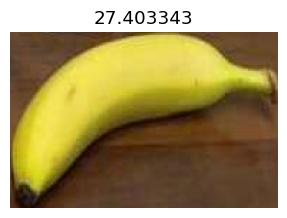

In [ ]:
pipeline(image,'yellow object',predictor)

# DINO + SAM

## Install Grounding DINO and Segment Anything Model

Our project will use two groundbreaking designs - [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) - for zero-shot detection and [Segment Anything Model (SAM)](https://github.com/facebookresearch/segment-anything) - for converting boxes into segmentations. We have to install them first.


In [ ]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


In [ ]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!git checkout -q 57535c5a79791cb76e36fdb64975271354f10251
!pip install -q -e .

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 421, done.
remote: Counting objects: 100% (182/182), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 421 (delta 138), reused 125 (delta 121), pack-reused 239
Receiving objects: 100% (421/421), 12.85 MiB | 12.67 MiB/s, done.
Resolving deltas: 100% (216/216), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 13.1 MB/s eta 0:00:00


In [ ]:
%cd {HOME}
import sys
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

/content
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-vmrpdvlu
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-vmrpdvlu
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36587 sha256=5766f8e952e6e69826b85eb0610d59154d71153b3f27c951d37397cfe257ee47
  Stored in directory: /tmp/pip-ephem-wheel-cache-jov7hpd_/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


In [ ]:
!pip uninstall -y supervision
!pip install -q supervision==0.6.0

import supervision as sv
print(sv.__version__)

Found existing installation: supervision 0.4.0
Uninstalling supervision-0.4.0:
  Successfully uninstalled supervision-0.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision==0.4.0, but you have supervision 0.6.0 which is incompatible.
0.6.0


### Download Grounding DINO Model Weights

To run Grounding DINO we need two files - configuration and model weights. The configuration file is part of the [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) repository, which we have already cloned. The weights file, on the other hand, we need to download. We write the paths to both files to the `GROUNDING_DINO_CONFIG_PATH` and `GROUNDING_DINO_CHECKPOINT_PATH` variables and verify if the paths are correct and the files exist on disk.

In [ ]:
import os

GROUNDING_DINO_CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(GROUNDING_DINO_CONFIG_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CONFIG_PATH))

/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [ ]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [ ]:
import os

GROUNDING_DINO_CHECKPOINT_PATH = os.path.join(HOME, "weights", "groundingdino_swint_ogc.pth")
print(GROUNDING_DINO_CHECKPOINT_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CHECKPOINT_PATH))

/content/weights/groundingdino_swint_ogc.pth ; exist: True


### Download Segment Anything Model (SAM) Weights

As with Grounding DINO, in order to run SAM we need a weights file, which we must first download. We write the path to local weight file to `SAM_CHECKPOINT_PATH` variable and verify if the path is correct and the file exist on disk.

In [ ]:
!pip install -q jupyter_bbox_widget dataclasses-json supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.3 MB/s eta 0:00:00


In [ ]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

/content
/content/weights


In [ ]:
import os

SAM_CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(SAM_CHECKPOINT_PATH, "; exist:", os.path.isfile(SAM_CHECKPOINT_PATH))

/content/weights/sam_vit_h_4b8939.pth ; exist: True


## Load models

In [ ]:
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Load Grounding DINO Model

In [ ]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import Model

grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/content/GroundingDINO


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

### Load Segment Anything Model (SAM)

In [ ]:
SAM_ENCODER_VERSION = "vit_h"

In [ ]:
from segment_anything import sam_model_registry, SamPredictor

sam = sam_model_registry[SAM_ENCODER_VERSION](checkpoint=SAM_CHECKPOINT_PATH).to(device=DEVICE)
sam_predictor = SamPredictor(sam)

## Single Image Object Searching

Before we automatically annotate the entire dataset let's focus for a moment on a single image.

### Using **Prompt**:

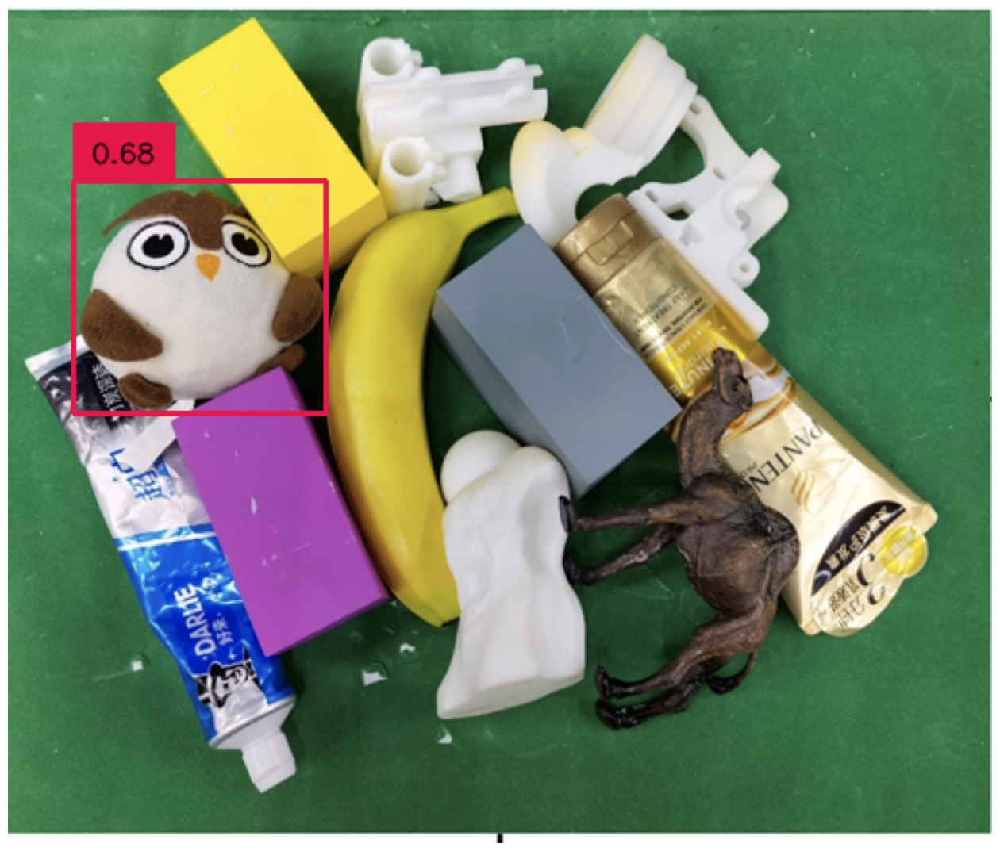

In [21]:
import cv2
import supervision as sv
SOURCE_IMAGE_PATH = "/content/image4.png"
TEXT_PROMPT = "owl toy with white and brow color"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25
# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_caption(
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

labels = []
for box in detections[0]:
  labels.append(f"{box[2]:0.2f}")
labels
box_annotator = sv.BoxAnnotator()
annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections[0],labels=labels)
sv.plot_image(annotated_frame, (16, 16))

In [ ]:
import cv2
xyxy=[]
# convert detections to masks
for box in detections[0]:
  xyxy.append(box[0])
print(xyxy[0])

[433.2538 434.2608 623.1227 562.6521]


In [ ]:
import cv2
import numpy as np
import supervision as sv

image_bgr = cv2.imread(SOURCE_IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

sam_predictor.set_image(image_rgb)

masks, scores, logits = sam_predictor.predict(
    box=xyxy[0],
    multimask_output=True
)

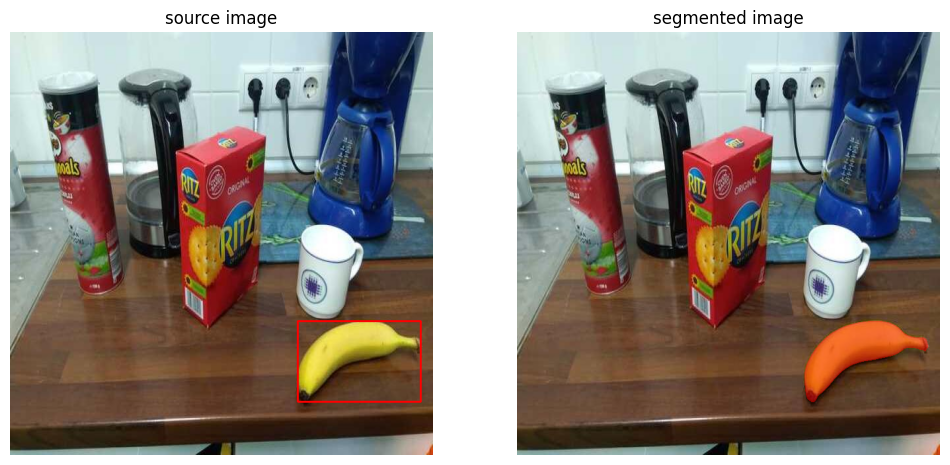

In [ ]:
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red())  # Remove color_lookup parameter

detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)
detections = detections[detections.area == np.max(detections.area)]

source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)


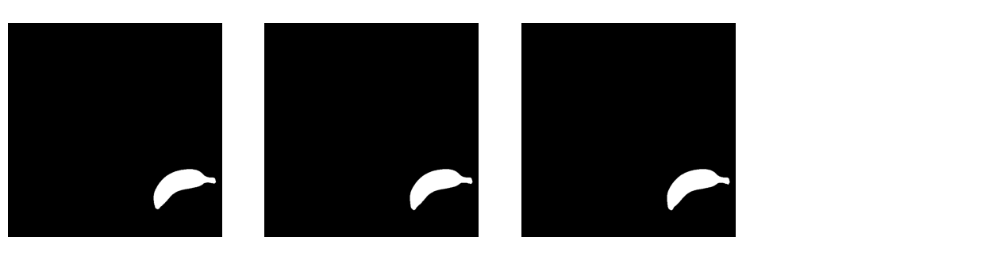

In [ ]:
import supervision as v

sv.plot_images_grid(
    images=masks,
    grid_size=(1, 4),
    size=(16, 4)
)

### Using **Classes**

In [ ]:
import numpy as np
from segment_anything import SamPredictor


def segment(sam_predictor: SamPredictor, image: np.ndarray, xyxy: np.ndarray) -> np.ndarray:
    sam_predictor.set_image(image)
    result_masks = []
    for box in xyxy:
        masks, scores, logits = sam_predictor.predict(
            box=box,
            multimask_output=True
        )
        index = np.argmax(scores)
        result_masks.append(masks[index])
    return np.array(result_masks)

In [ ]:
from typing import List

def enhance_class_name(class_names: List[str]) -> List[str]:
    return [
        f"all {class_name}s"
        for class_name
        in class_names
    ]

In [ ]:
SOURCE_IMAGE_PATH = "/content/image4.jpg"
CLASSES = ['cup', "fruite" , "box"]
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

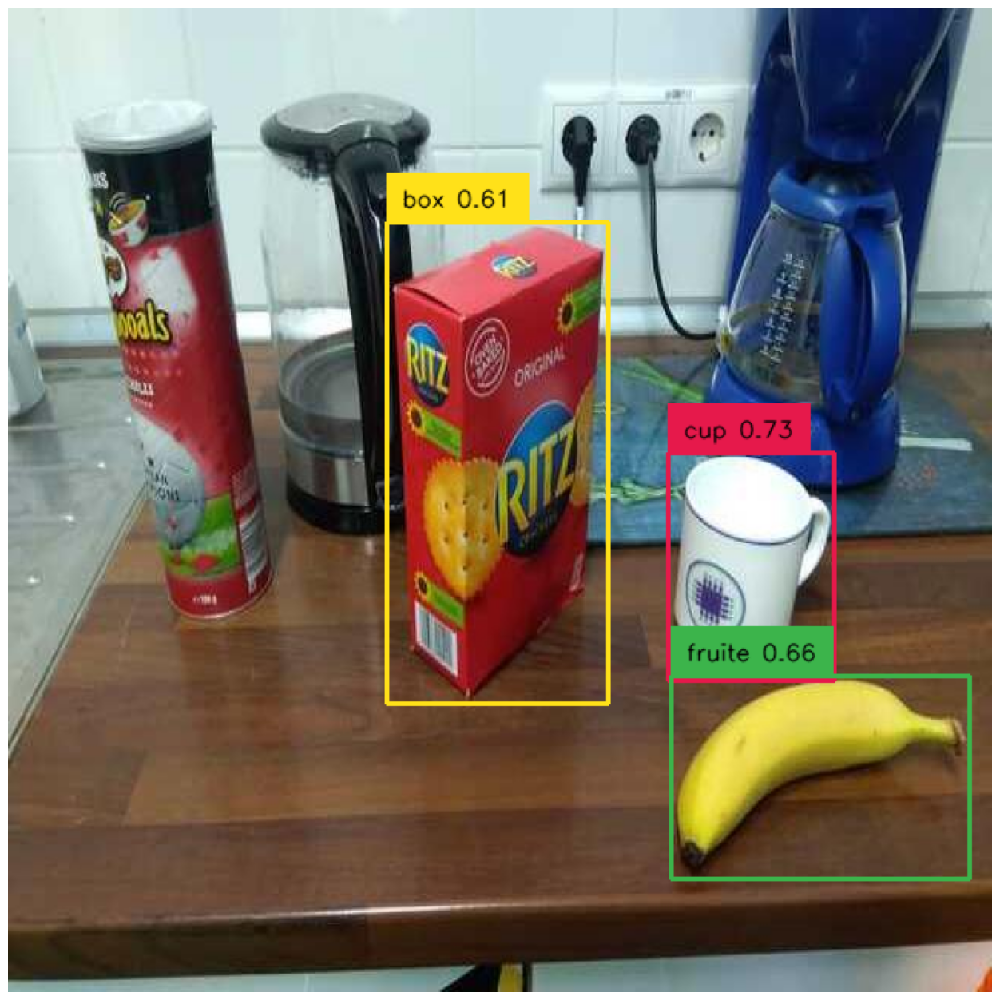

In [ ]:
import cv2
import supervision as sv

# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_classes(
    image=image,
    classes=enhance_class_name(class_names=CLASSES),
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)
detections
# annotate image with detections
box_annotator = sv.BoxAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _
    in detections]

annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

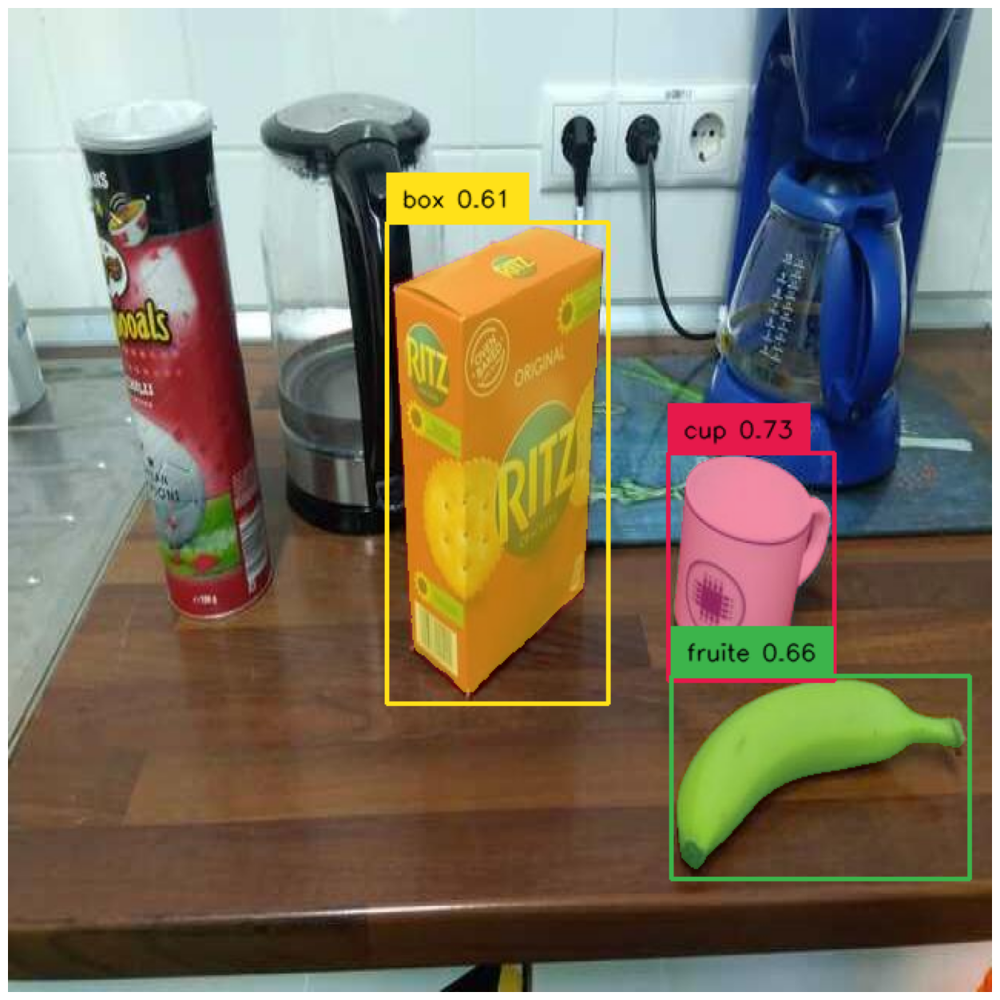

In [ ]:
import cv2

# convert detections to masks
detections.mask = segment(
    sam_predictor=sam_predictor,
    image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
    xyxy=detections.xyxy
)

# annotate image with detections
box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _
    in detections]
annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_image, (16, 16))

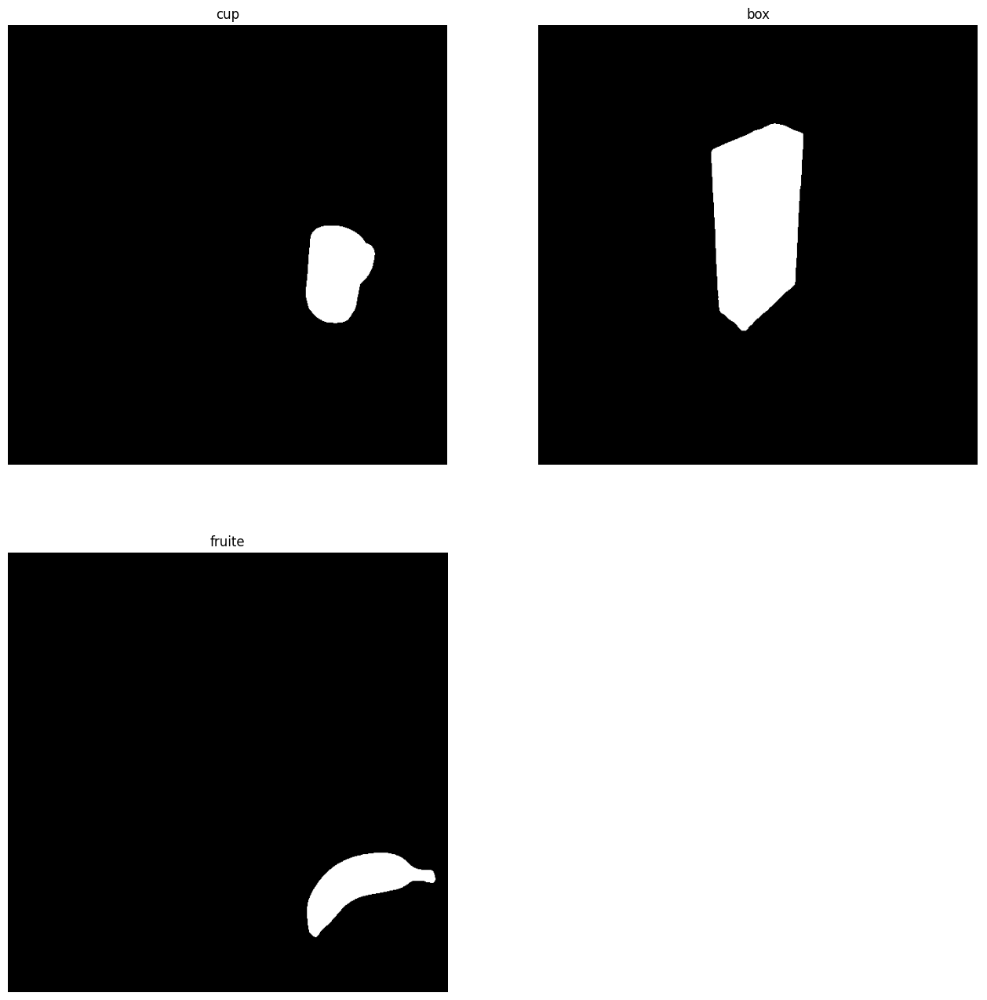

In [ ]:
import math

grid_size_dimension = math.ceil(math.sqrt(len(detections.mask)))

titles = [
    CLASSES[class_id]
    for class_id
    in detections.class_id
]

sv.plot_images_grid(
    images=detections.mask,
    titles=titles,
    grid_size=(grid_size_dimension, grid_size_dimension),
    size=(16, 16)
)


# microphone

In [ ]:
!pip install ffmpeg-python

In [ ]:
from transformers import (Wav2Vec2Processor, Wav2Vec2ForCTC)
import torchaudio
import torch

def speech_file_to_array_fn(voice_path, resampling_to=16000):
    speech_array, sampling_rate = torchaudio.load(voice_path)
    resampler = torchaudio.transforms.Resample(sampling_rate, resampling_to)

    return resampler(speech_array)[0].numpy(), sampling_rate

# load the model
cp = "bakrianoo/sinai-voice-ar-stt"
processor = Wav2Vec2Processor.from_pretrained(cp)
model = Wav2Vec2ForCTC.from_pretrained(cp)

preprocessor_config.json:   0%|          | 0.00/212 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/300 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/435 [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/695 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


config.json:   0%|          | 0.00/2.03k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

Some weights of the model checkpoint at bakrianoo/sinai-voice-ar-stt were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at bakrianoo/sinai-voice-ar-stt and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0']
You should probably TRAIN this mode

In [ ]:
from IPython.display import HTML, Audio
from google.colab.output import eval_js
from base64 import b64decode
import numpy as np
from scipy.io.wavfile import read as wav_read
import io
import ffmpeg

AUDIO_HTML = """
<script>
var my_div = document.createElement("DIV");
var my_p = document.createElement("P");
var my_btn = document.createElement("BUTTON");
var t = document.createTextNode("Press to start recording");

my_btn.appendChild(t);
//my_p.appendChild(my_btn);
my_div.appendChild(my_btn);
document.body.appendChild(my_div);

var base64data = 0;
var reader;
var recorder, gumStream;
var recordButton = my_btn;

var handleSuccess = function(stream) {
  gumStream = stream;
  var options = {
    //bitsPerSecond: 8000, //chrome seems to ignore, always 48k
    mimeType: 'audio/webm;codecs=opus'
    //mimeType : 'audio/webm;codecs=pcm'
  };
  //recorder = new MediaRecorder(stream, options);
  recorder = new MediaRecorder(stream);
  recorder.ondataavailable = function(e) {
    var url = URL.createObjectURL(e.data);
    var preview = document.createElement('audio');
    preview.controls = true;
    preview.src = url;
    document.body.appendChild(preview);

    reader = new FileReader();
    reader.readAsDataURL(e.data);
    reader.onloadend = function() {
      base64data = reader.result;
      //console.log("Inside FileReader:" + base64data);
    }
  };
  recorder.start();
};

recordButton.innerText = "Recording... press to stop";

navigator.mediaDevices.getUserMedia({
  audio: true
}).then(handleSuccess);

function toggleRecording() {
  if (recorder && recorder.state == "recording") {
    recorder.stop();
    gumStream.getAudioTracks()[0].stop();
    recordButton.innerText = "Saving the recording... pls wait!"
  }
}

// https://stackoverflow.com/a/951057
function sleep(ms) {
  return new Promise(resolve => setTimeout(resolve, ms));
}

var data = new Promise(resolve => {
  //recordButton.addEventListener("click", toggleRecording);
  recordButton.onclick = () => {
    toggleRecording()

    sleep(2000).then(() => {
      // wait 2000ms for the data to be available...
      // ideally this should use something like await...
      //console.log("Inside data:" + base64data)
      resolve(base64data.toString())

    });

  }
});

</script>
"""

def get_audio():
  display(HTML(AUDIO_HTML))
  data = eval_js("data")
  binary = b64decode(data.split(',')[1])

  process = (ffmpeg
    .input('pipe:0')
    .output('pipe:1', format='mp3', acodec='libmp3lame', ab='128k')  # Specify MP3 format and audio codec
    .run_async(pipe_stdin=True, pipe_stdout=True, pipe_stderr=True, quiet=True, overwrite_output=True)
  )
  output, err = process.communicate(input=binary)

  return output

In [ ]:
audio_mp3 = get_audio()
Audio(data=audio_mp3, autoplay=False)
# Save the MP3 file
with open('recorded_audio.mp3', 'wb') as f:
    f.write(audio_mp3)

In [ ]:
# recognize the text in a sample sound file
sound_path = './recorded_audio.mp3'

sample, sr = speech_file_to_array_fn(sound_path)
inputs = processor([sample], sampling_rate=16_000, return_tensors="pt", padding=True)

with torch.no_grad():
    logits = model(inputs.input_values,).logits

predicted_ids = torch.argmax(logits, dim=-1)

print("Prediction:", processor.batch_decode(predicted_ids))

Prediction: ['موزا صفرا']


In [ ]:
processor.batch_decode(predicted_ids)[0]

'موزا صفرا'

# Multi-Langual-CLIP

In [ ]:
!pip install sentence_transformers

In [ ]:
from sentence_transformers import SentenceTransformer, util
from PIL import Image
import glob
import torch
import pickle
import zipfile
from IPython.display import display
from IPython.display import Image as IPImage
import os
from tqdm.autonotebook import tqdm


In [ ]:
from IPython.display import display
from PIL import Image
import matplotlib.pyplot as plt
# Set the size of the figure
def display_10(img_matrix):
  fig = plt.figure(figsize=(20, 5))


  # Display the image using PIL
  img_pil = Image.fromarray(img_matrix)
  plt.imshow(img_pil)

  # Set title and hide axis


  # Display the figure
  display(fig)

In [ ]:
image = "/content/image11.jpeg"

In [ ]:
import cv2
import os
from glob import glob

def objectDetection(img_path: str, model) -> list:
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    image_name = os.path.basename(img_path)
    image_name = image_name.split('.')[0]

    # Assuming 'model' is an instance of a class with a callable method (e.g., __call__)
    result = model(image)

    # Assuming 'result' has a 'crop' method, and 'render' method returns a tuple
    result.crop(save_dir=image_name)
    detectedObjects = result.render()[0]
    path = "/content/" + image_name + '/crops/**/*.jpg'

    listOfObjects = []
    for filename in glob(path):
        obj = cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)
        listOfObjects.append(obj)

    return listOfObjects, detectedObjects, result


In [ ]:
load_image = cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
listOfObjects, detectedObjects , results = objectDetection(image, objectDetectorModel)

Saved 1 image to image11
Saved results to image11



In [ ]:
from PIL import Image
import numpy as np

objects = []

# Assuming listOfObjects is your list of image matrices (NumPy arrays)
# Example: listOfObjects = [np.array([[...], [...], ...]), ...]
for i in range(len(listOfObjects)):
    # Convert the image matrix to a PIL Image
    image = Image.fromarray(listOfObjects[i])

    # Save the PIL Image to a BytesIO object to simulate writing to a file
    from io import BytesIO
    image_stream = BytesIO()
    # Use the correct format based on your image data (e.g., 'PNG', 'JPEG', etc.)
    image.save(image_stream, format='PNG')  # Change 'PNG' to the appropriate format

    # Create a new PIL Image from the BytesIO stream
    try:
        jpeg_image = Image.open(BytesIO(image_stream.getvalue()))
        objects.append(jpeg_image)
    except Exception as e:
        print(f"Error processing image {i}: {e}")

# Now, 'objects' contains a list of PIL Image objects


Text: علبة شاي زرقاء
Score: tensor(0.24950)


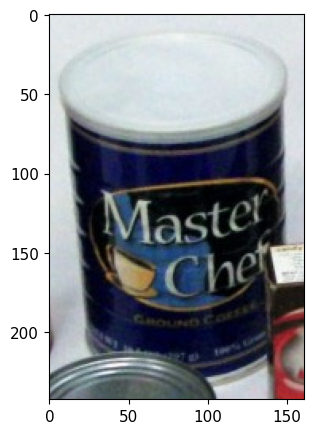

Text: علبة خردل أصفر
Score: tensor(0.27164)


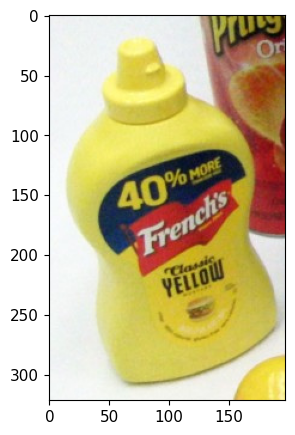

In [ ]:
from sentence_transformers import SentenceTransformer, util
from PIL import Image, ImageFile
import requests
import torch

# We use the original clip-ViT-B-32 for encoding images
img_model = SentenceTransformer('clip-ViT-B-32')

# Our text embedding model is aligned to the img_model and maps 50+
# languages to the same vector space
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')


# Map images to the vector space
img_embeddings = img_model.encode(objects)

# Now we encode our text:
texts = ["علبة شاي زرقاء" , "علبة خردل أصفر"]

text_embeddings = text_model.encode(texts)

# Compute cosine similarities:
cos_sim = util.cos_sim(text_embeddings, img_embeddings)

for text, scores in zip(texts, cos_sim):
    max_img_idx = torch.argmax(scores)
    print("Text:", text)
    print("Score:", scores[max_img_idx] )

    # Assuming listOfObjects[max_img_idx] is the image matrix
    img_matrix = listOfObjects[max_img_idx]
    display_10(img_matrix)

# dino with Arabic

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!pip install git+https://github.com/StarkBotsIndustries/googletrans.git

  Cloning https://github.com/StarkBotsIndustries/googletrans.git to /tmp/pip-req-build-k8m27oan
  Running command git clone --filter=blob:none --quiet https://github.com/StarkBotsIndustries/googletrans.git /tmp/pip-req-build-k8m27oan
  Resolved https://github.com/StarkBotsIndustries/googletrans.git to commit 58d761afa81e15023984e079e9c29673e6c76c50
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 840.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.1 MB/s eta 0:00:00
  Created wheel for googletrans-py: filename=googletrans_py-4.0.0-py3-none-any.whl size=13020 sha256=b4aa97aa0e83d45e3ad4987318a209f72366c3adfda7962a88ef0d0887292dec
  Stored in directory: /tmp/pip-ephem-wheel-cache-ypy5wqzl/wheels/f2/4c/a8/71af0519d118c8e59b8b03e35224a0aa7b4a919aa9367

In [ ]:
from googletrans import Translator

# source_text = processor.batch_decode(predicted_ids)[0]
source_text = "فاكهة حمراء"
translator = Translator()
result = translator.translate(source_text, dest='en')
print(result)
x=result.text
x

Translated(src=ar, dest=en, text=Red fruit, pronunciation=None, extra_data="{'confiden...")


'Red fruit'

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


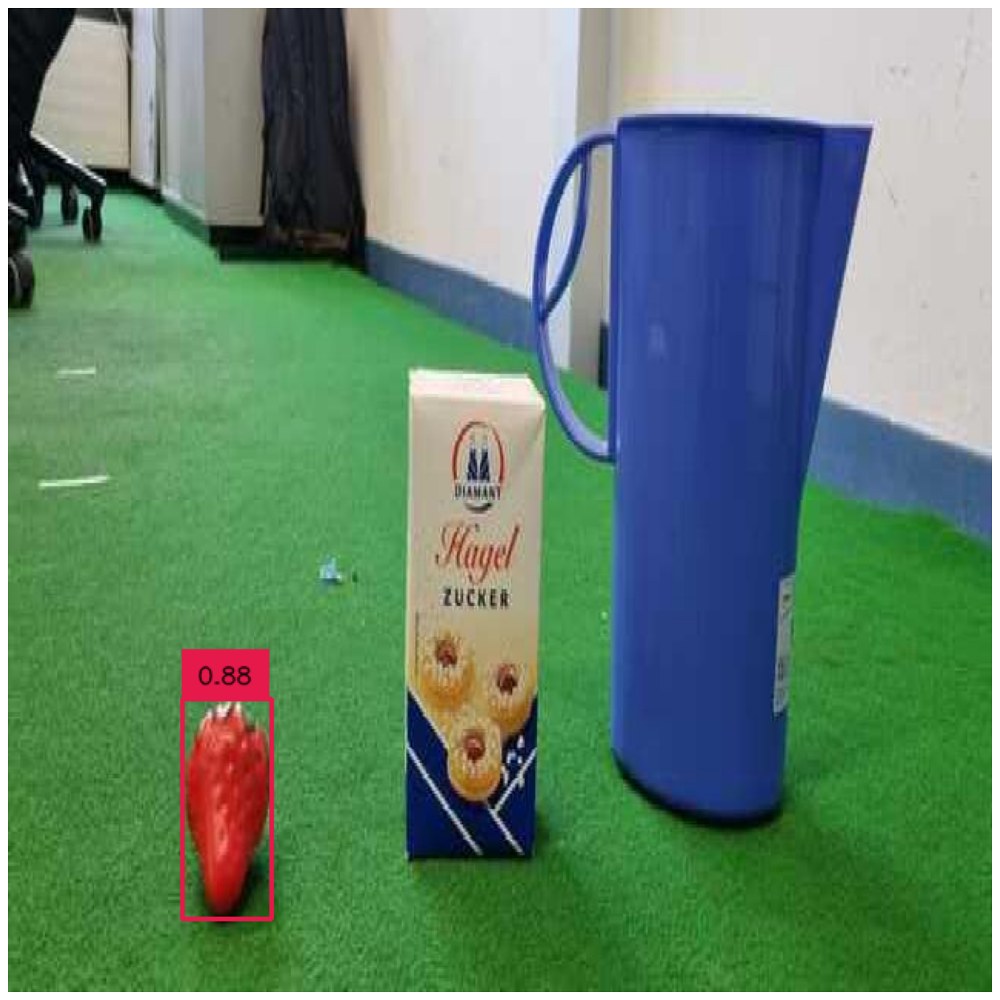

In [ ]:
import cv2
import supervision as sv
SOURCE_IMAGE_PATH = "/content/image6.jpg"
TEXT_PROMPT = result.text
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25
# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_caption(
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

labels = []
for box in detections[0]:
  labels.append(f"{box[2]:0.2f}")
labels
box_annotator = sv.BoxAnnotator()
annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections[0],labels=labels)
sv.plot_image(annotated_frame, (16, 16))

In [ ]:
import numpy as np  # For numerical operations
from PIL import Image  # For image processing
import matplotlib.pyplot as plt  # For visualization
from IPython.display import display  # For displaying images in Jupyter Notebook
# Replace 'path/to/your/image.jpg' with the actual path to your image
img_pil = Image.open('path/to/your/image.jpg')
img_matrix = np.array(img_pil)  # Convert to a NumPy array


In [ ]:
import cv2
xyxy=[]
# convert detections to masks
for box in detections[0]:
  xyxy.append(box[0])
print(xyxy[0])

[113.93596 449.3205  171.03664 592.07733]


In [ ]:
import cv2
import numpy as np
import supervision as sv

image_bgr = cv2.imread(SOURCE_IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

sam_predictor.set_image(image_rgb)

masks, scores, logits = sam_predictor.predict(
    box=xyxy[0],
    multimask_output=True
)

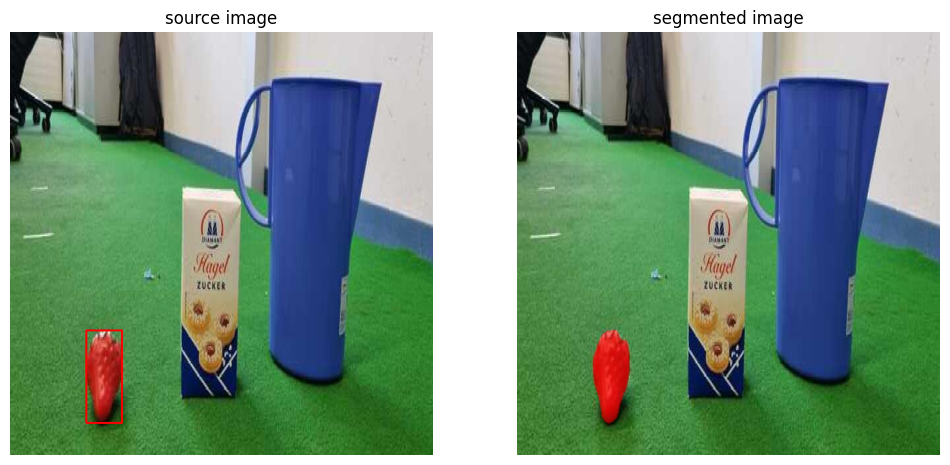

In [ ]:
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red())  # Remove color_lookup parameter

detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)
detections = detections[detections.area == np.max(detections.area)]

source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)


# functions

In [ ]:
def get_promt():
  audio_mp3 = get_audio()
  Audio(data=audio_mp3, autoplay=False)
  # Save the MP3 file
  with open('recorded_audio.mp3', 'wb') as f:
      f.write(audio_mp3)
  # recognize the text in a sample sound file
  sound_path = './recorded_audio.mp3'

  sample, sr = speech_file_to_array_fn(sound_path)
  inputs = processor([sample], sampling_rate=16_000, return_tensors="pt", padding=True)

  with torch.no_grad():
      logits = model(inputs.input_values,).logits

  predicted_ids = torch.argmax(logits, dim=-1)

  source_text = processor.batch_decode(predicted_ids)[0]

  translator = Translator()
  result = translator.translate(source_text, dest='en')
  print(result)
  x=result.text
  return x,source_text

In [ ]:
def get_opj (IMAGE_PATH,result):
  SOURCE_IMAGE_PATH = IMAGE_PATH
  TEXT_PROMPT = result
  BOX_TRESHOLD = 0.35
  TEXT_TRESHOLD = 0.25
  # load image
  image = cv2.imread(SOURCE_IMAGE_PATH)

  # detect objects
  detections = grounding_dino_model.predict_with_caption(
      image=image,
      caption=TEXT_PROMPT,
      box_threshold=BOX_TRESHOLD,
      text_threshold=TEXT_TRESHOLD
  )

  labels = []
  for box in detections[0]:
    labels.append(f"{box[2]:0.2f}")
  labels
  box_annotator = sv.BoxAnnotator()

  xyxy=[]
  # convert detections to masks
  for box in detections[0]:
    xyxy.append(box[0])
  print(xyxy[0])

  image_bgr = cv2.imread(SOURCE_IMAGE_PATH)
  image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

  sam_predictor.set_image(image_rgb)

  masks, scores, logits = sam_predictor.predict(
      box=xyxy[0],
      multimask_output=True
  )

  box_annotator = sv.BoxAnnotator(color=sv.Color.red())
  mask_annotator = sv.MaskAnnotator(color=sv.Color.red())  # Remove color_lookup parameter

  detections = sv.Detections(
      xyxy=sv.mask_to_xyxy(masks=masks),
      mask=masks
  )
  detections = detections[detections.area == np.max(detections.area)]

  source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
  segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

  sv.plot_images_grid(
      images=[source_image, segmented_image],
      grid_size=(1, 2),
      titles=['source image', 'segmented image']
  )

#test DINO+SAM

Translated(src=ar, dest=en, text=the fruit, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[432.70984 433.45288 623.2882  562.90765]


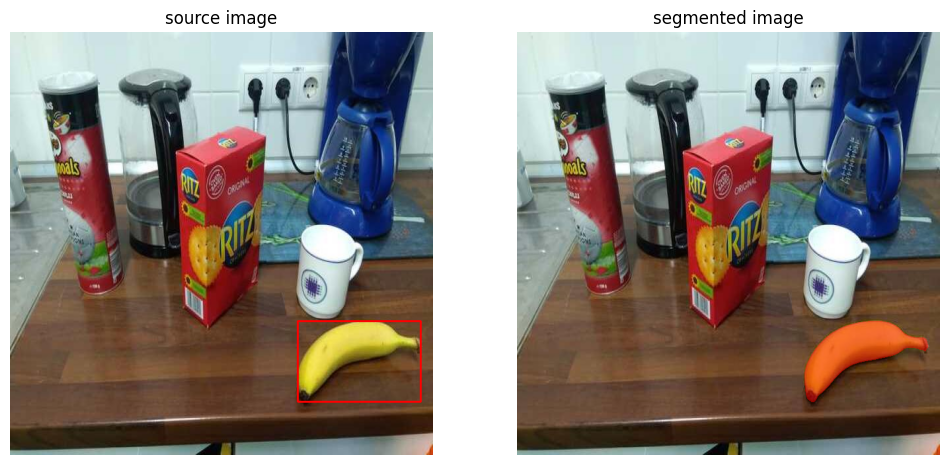

الفاكهة


In [ ]:
IMAGE_PATH="/content/image4.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=Tea Cup, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[431.68906 289.80792 535.1659  435.08136]


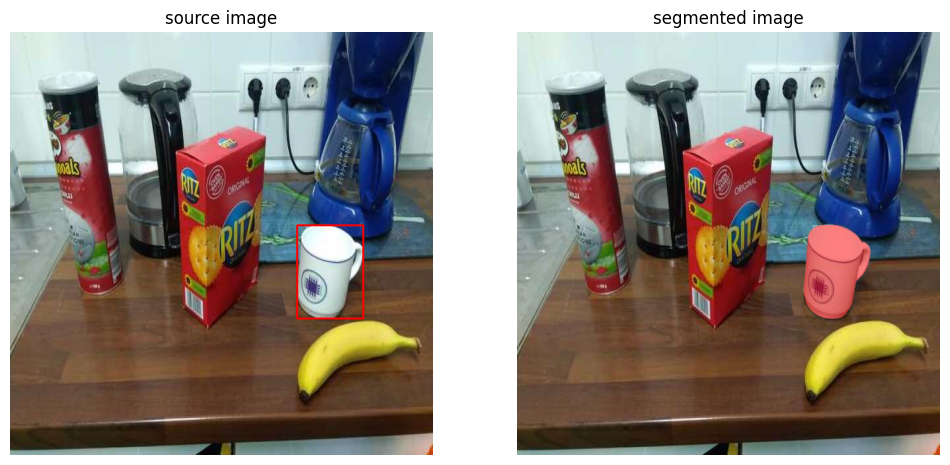

كأس للشاي


In [ ]:
IMAGE_PATH="/content/image4.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=The cup is behind bananas, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[429.76752 288.20688 535.92163 435.27127]


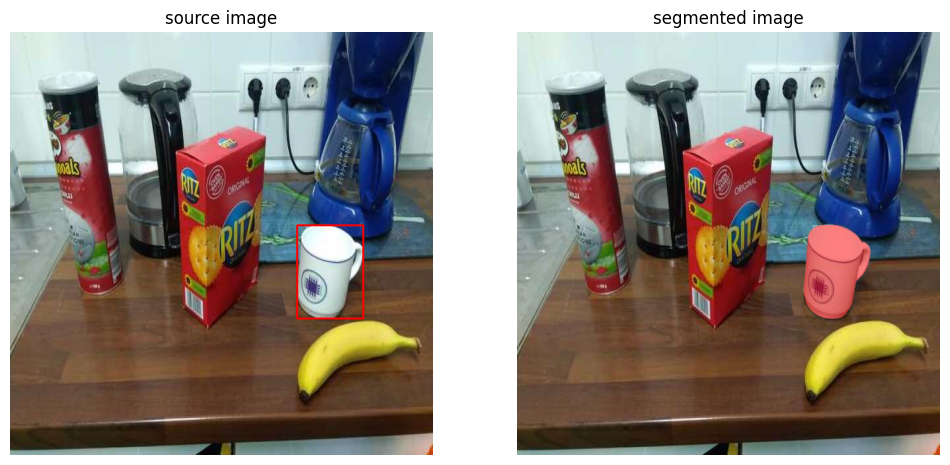

الكأس خلف الموز


In [ ]:
IMAGE_PATH="/content/image4.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=The thing is on the left, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[247.64789 139.0794  389.19727 450.08453]


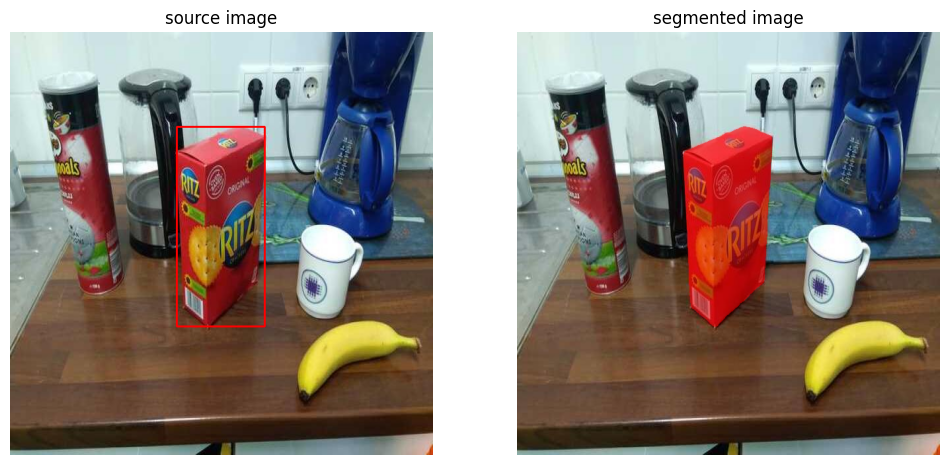

الشيء على اليسار


In [ ]:
IMAGE_PATH="/content/image4.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=Canned food, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[273.80203 199.67715 369.475   473.5314 ]


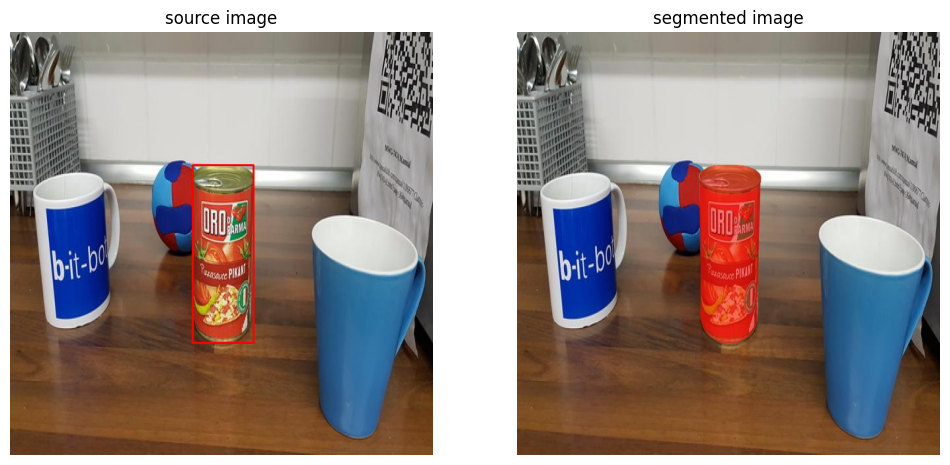

طعام معلب


In [ ]:
IMAGE_PATH="/content/image2.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=the ball, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[212.21849 191.46512 283.59616 337.66977]


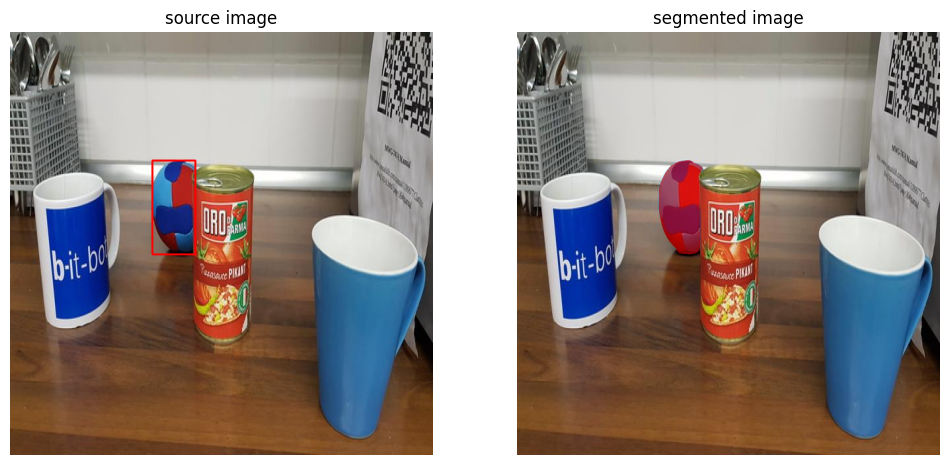

الكرة


In [ ]:
IMAGE_PATH="/content/image2.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=White cup, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[ 32.41633 210.46432 168.07687 450.2015 ]


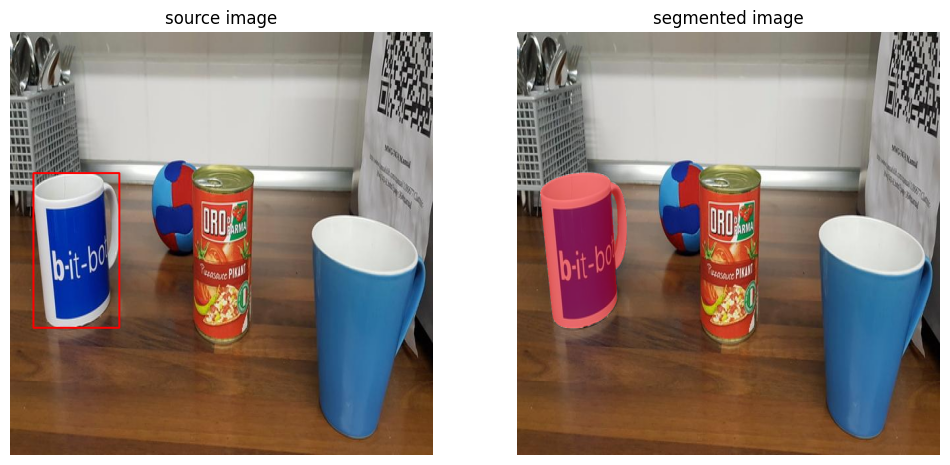

كأس بيضاء


In [ ]:
IMAGE_PATH="/content/image2.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=The fruit is on the left, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[421.35788 145.14651 580.46533 471.327  ]


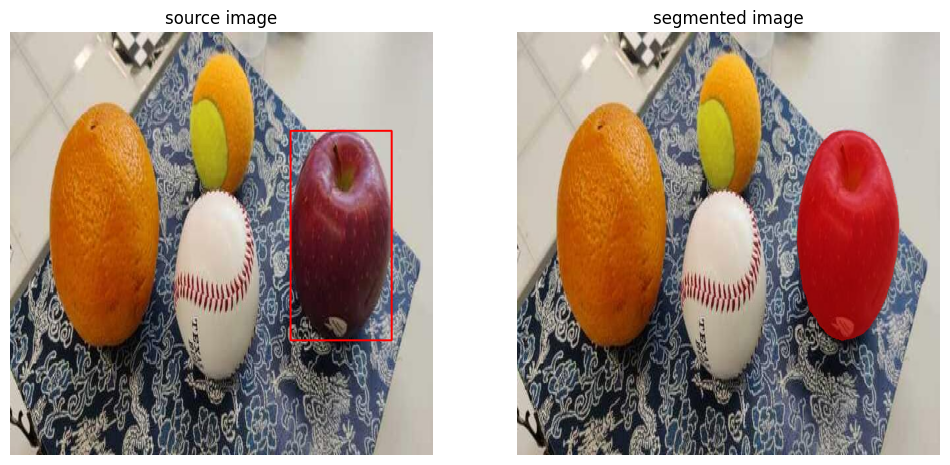

الفاكهة على اليسار


In [ ]:
IMAGE_PATH="/content/image1.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=Fruits on the right, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[421.3463  145.65314 580.45105 471.76917]


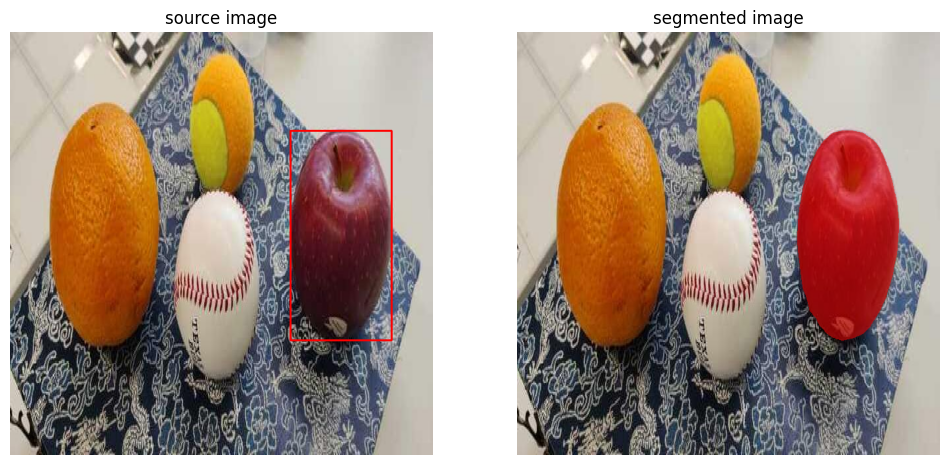

ألفاكهة على اليمين


In [ ]:
IMAGE_PATH="/content/image1.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=tennis ball, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[270.15833   31.204544 370.31128  244.13307 ]


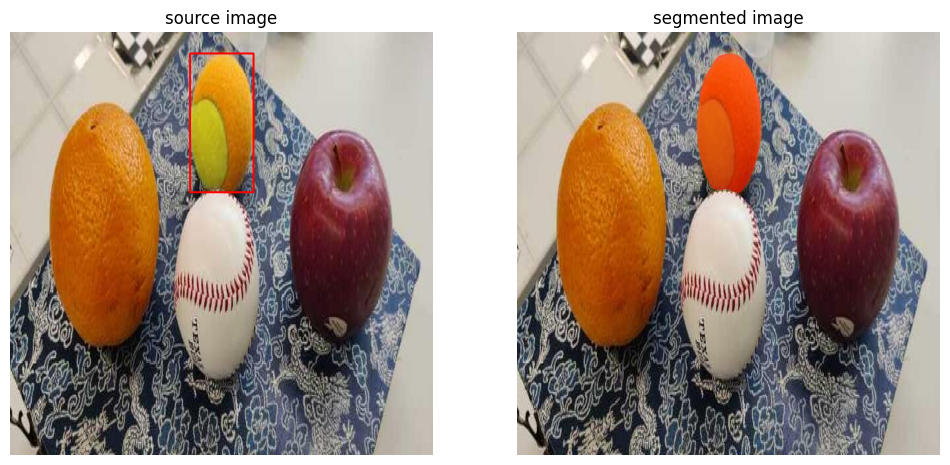

كرة التنس


In [ ]:
IMAGE_PATH="/content/image1.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

Translated(src=ar, dest=en, text=Baseball, pronunciation=None, extra_data="{'confiden...")


/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


[246.14087 239.11278 377.76282 527.4061 ]


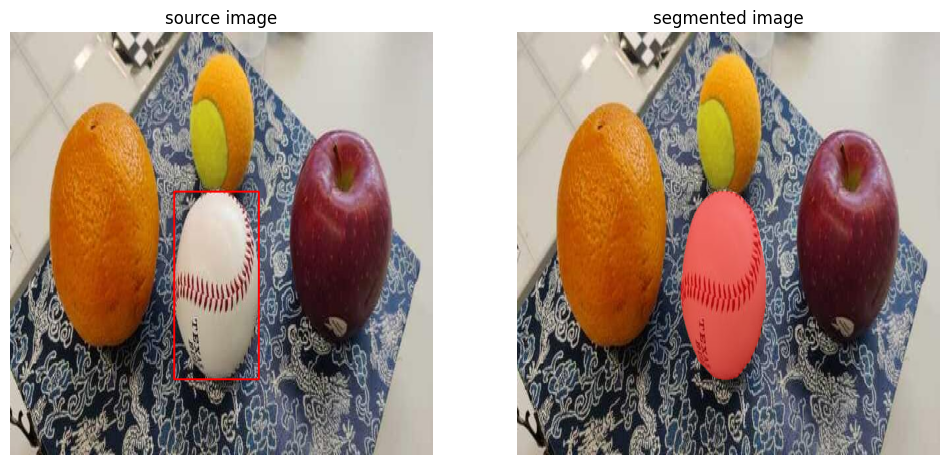

كرة القاعدة


In [ ]:
IMAGE_PATH="/content/image1.jpg"
result_text,ar_text=get_promt()
get_opj (IMAGE_PATH,result_text)
print(ar_text)

#test YOLO+SAM+CLIP